## Final Version

## PACKAGEs & MODULEs & FUNCTIONs

### Install Packages

In [152]:
# Install packages
#pip install plotly-express
#pip install ipython
#pip install zstandard
#pip install pyarrow
#pip install ipywidgets
#pip install ipykernel
#pip install --upgrade nbformat
#!pip install joblib
#!pip install --upgrade pip
#!pip install tensorflow
#%pip install joblib
#%pip install --upgrade pip
#%pip install tensorflow
#pip install tf-nightly

### Import Modules

In [153]:
# Import modules
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm
sns.set(color_codes=True)
%matplotlib inline

import requests, zipfile, io
import os
import time

from utils_mod_v2 import *

import torch
import torch.nn as nn
from sklearn import preprocessing
import torch.utils.data as data_utils
from sklearn.metrics import *

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

from sklearn.ensemble import IsolationForest

from sklearn.model_selection import train_test_split
import copy

from sklearn.preprocessing import MinMaxScaler

from numpy.random import seed
import tensorflow as tf
from tensorflow import keras

from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, RepeatVector
from keras.models import Model
from keras import regularizers
from keras.callbacks import EarlyStopping

from scipy import stats
import random as random

import pickle

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [154]:
# Set random seeds for reproduction
seed=42
random.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

### Define Functions

In [155]:
# Functions
# All functions are defined in utils_mod_v2.py

## LOAD DATA

### Load data (full dataset)

In [156]:
# Read data
path_to_file = 'G:/My Drive/_My_Files_GoogleDrive/POS Data Science PUC/TCC/Datasets/joined_dataset.csv'

df_full = pd.read_csv(path_to_file)

df_full['Timestamp']= pd.to_datetime(df_full['Timestamp'])              # Set Timestamp as datetime
df_full.index = df_full['Timestamp']                                    # Set Timestamp as index (for future join on it)
df_full = df_full.drop(columns=['Timestamp'])                           # Drop Timestamp - not neede anymore
df_full = df_full.sort_index()                                          # Sort by index (Timestamp)
df_full = df_full[~df_full.index.duplicated(keep='last')]               # Remove any duplicated index
df_full

,uuid_835267,uuid_835268,uuid_835269,uuid_835270,uuid_835271,uuid_835272,uuid_835273,uuid_835274,uuid_835275,uuid_835276,uuid_835277,uuid_835278,uuid_835279,uuid_835280,uuid_835281,uuid_835282,uuid_835283,uuid_835284,uuid_835285,uuid_835286,uuid_835287,uuid_835288,uuid_835289,uuid_835290,uuid_835291
Timestamp,,,,,,,,,,,,,,,,,,,,,,,,,
2021-09-08 00:00:00,13802539.0,41001566.0,2624.0,1736413.0,267133.0,40446.0,3913.0,10291.0,215.0,0.0,0.0,3.154024,3.755191,0.002980,1.234093e+09,3.488378e+09,1.531346e+09,54142356.0,158.461237,57.158422,25.415433,59.303768,0.000000,482.404332,74020.917273
2021-09-08 00:05:00,13350142.0,38203698.0,2288.0,1569801.0,252768.0,36156.0,4016.0,9597.0,176.0,0.0,0.0,3.066064,3.586697,0.003152,9.596260e+08,3.155806e+09,1.302588e+09,63458694.0,141.832391,31.563430,25.255610,58.711781,0.000000,461.508545,65913.304733
2021-09-08 00:10:00,13202696.0,37986685.0,2617.0,1790553.0,207379.0,49207.0,3760.0,9507.0,175.0,0.0,0.0,3.166386,3.935190,0.002565,9.298221e+08,2.995857e+09,1.325642e+09,98381837.0,142.293185,31.811047,25.196351,58.974376,725.000000,460.520028,64665.269205
2021-09-08 00:15:00,13304590.0,37555194.0,2419.0,1659255.0,210087.0,44331.0,4819.0,9850.0,161.0,0.0,0.0,3.024031,3.610530,0.002527,1.005467e+09,3.012874e+09,1.395300e+09,59350563.0,137.613888,31.236735,25.767075,58.793597,0.000000,464.010663,64230.928248
2021-09-08 00:20:00,13167202.0,37219296.0,2130.0,1682929.0,219610.0,31734.0,5236.0,9272.0,177.0,0.0,0.0,3.168459,3.636019,0.004025,9.097198e+08,3.025640e+09,1.330230e+09,86158092.0,138.050632,32.049276,24.948552,58.851975,0.000000,465.596012,62490.337887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-23 15:55:00,12111516.0,24972420.0,1229.0,1376466.0,66238.0,28746.0,4345.0,21970.0,1197.0,0.0,0.0,4.382856,2.803052,0.003001,5.231450e+08,4.120173e+09,3.118469e+09,305942843.0,105.488266,40.274260,7.270746,58.297297,761.529412,415.625342,46549.815730
2023-06-23 16:00:00,12058774.0,24294971.0,1118.0,1446675.0,66679.0,30066.0,4123.0,21003.0,1140.0,0.0,0.0,4.474455,2.958767,0.002795,4.673500e+08,3.994868e+09,2.993826e+09,348111516.0,105.086555,40.512629,7.415742,58.067348,0.000000,427.322533,46211.545974
2023-06-23 16:05:00,11819049.0,23416543.0,1265.0,1267406.0,61406.0,27416.0,3926.0,20140.0,1110.0,0.0,0.0,4.561457,2.671394,0.003084,4.517168e+08,3.799071e+09,2.947157e+09,305340170.0,104.966462,40.648256,7.435959,58.365061,0.000000,413.926468,46159.106529


## SET GLOBAL VARIABLES

### Define and Set Global Variables

In [157]:
# Set global variables

# ============================================================> Load Data
# Loading Data
LIST_OF_SERIES = ['uuid_835267', 'uuid_835268', 'uuid_835270', 'uuid_835271', 'uuid_835272', 'uuid_835274', 'uuid_835275',
                  'uuid_835278', 'uuid_835279', 'uuid_835281', 'uuid_835282', 'uuid_835283', 'uuid_835284', 'uuid_835285',
                  'uuid_835290', 'uuid_835291']
N_SAMPLES = 34560                                   # Define how many samples to work with (e.g.: 288=1Day, 8640=1Month, 34560=4Months)

# ============================================================> Train/Test Split
# Train, Validation and Test splitting
TRAIN_SPLIT = 0.9                                   # Define the percentage of dataset that will be use as training dataset

# ============================================================> Preprocessing prameters
# Replace extreme Outliers (to improve smoothing performance)
EXT_OUT_IQR_EPOCHS = 5                              # Define the number of epochs to run the extreme outliers replacement function
EXT_OUT_Z_EPOCHS = 5                                # Define the number of epochs to run the extreme outliers replacement function
REP_BY_DAYS_BACK = 1                                # When an outlier is found, it is replaced by the value that the same serie has "REP_BY_DAYS_BACK" days back in time.
Z_THRESHOLD = 3                                     # Define the threshold in z_score approach to remove extreme outliers
IQR_K = 1.5                                         # Define the Inter Quartile Range distance in the IQR approach to remove extreme outliers

# Smoothing process
SMOOTHING_EPOCHS = 15                               # Define the number of epochs to run the smoothing function
ROLLING_WINDOW_SIZE = 12                            # Define the size of the rolling window
ROLLING_WINDOW_STD_THRESHOLD = 2                    # Define the std threshold in rolling windows approach to smooth the series
ROLLING_WINDOW_CENTER=True                          # Centers the rolling window

# Reshaping (2D to 3D - windows)
WIN_SIZE = 12                                       # Define the size of the window to train on each sample at once - lookback or lookforward.
WIN_DIR = 'backward'                                # Direction of the window (backward = WIN_SIZE samples to the past | forward = WIN_SIZE samples to the future)

# ============================================================> Model prameters
# Trainning parameters
BATCH_SIZE = int(df_full.shape[0]*TRAIN_SPLIT/100)  # Define the size of the batch
N_EPOCHS = 100                                      # Define the number of epochs to run the algorithm
VAL_SPLIT = 0.05                                    # Define the percentage of the training set that will be used as validation dataset
LOSS = 'mse'                                        # Define the loss function to be used (mae or mse)
OPTIMIZER = 'nadam'                                 # Define the optimizaer to be used (adam, adadelta, nadam, RMSprop)
ANOMALY_LAYER ='no'                                 # Whether to use the anomaly layer ==> Future use "need y_true/y_pred" to use the anomaly vector to set custom loss function.
EARLY_STOPPING = True                               # Whether to use EarlyStopping or not.
PATIENCE = 5                                        # EarlyStopping patience.
MONITOR = 'loss'                                    # EarlyStopping monitoring parameter.
MIN_DELTA = 0.0001                                  # EarlyStopping min_delta.

# ============================================================> Anomaly Detection Parameters
# Anomaly detection parameters
DIST = 'sqr'                                        # Define the distance function to be used (abs or sqr)
ANOMALY_COUNT_THRESHOLD = 2                         # Define the number of simoultaneous anomalous series
SENSITIVITY_PER_OF_MAX = 0.99                       # Define the percentage of the max(avg(loss)) of training as threshold
SENSITIVITY_PER_OF_SUM = 0.99                       # Define the percentage of the sum(sort(avg(loss))) of training as threshold
THRESHOLD_TO_USE = 'Individual'                     # Whether to use Individual or Average thresholds during detection

## ANALYZE DATA

### Analyze data

In [158]:
# Series basic analysis
# uuid_835267 - Very "rich" series - lot of information, extreme outliers and noise range=[1000000,30000000]
# uuid_835268 - Very "rich" series - lot of information, extreme outliers and noise range=[1000000,100000000]
# uuid_835269 - Very "odd" series - no seasonality identified, min=0 without max - extreme outliers and noise range=[100,10000]
# uuid_835270 - Very "rich" series - lot of information, extreme outliers and noise range=[100000,5000000]
# uuid_835271 - Very "rich" series - lot of information, extreme outliers and noise range=[20000,1000000]
# uuid_835272 - Very "odd" series - no seasonality identified, min= almost 0 without max - extreme outliers and noise range=[0, 30000]
# uuid_835273 - Very "rich" series - lot of information, extreme outliers and noise range=[100,100000]
# uuid_835274 - Very "rich" series - lot of information, extreme outliers and noise. At the beginning 1000-20000, then jumped to range=[1000,100000]
# uuid_835275 - Very "rich" series - lot of information, extreme outliers and noise. At the beginning 0-500, then jumped to range=[100,100000]
# uuid_835276 - Almost all zeros (with some very very extreme outliers)
# uuid_835277 - Almost all zeros (with some very very extreme outliers)
# uuid_835278 - Very "rich" series - lot of information, extreme outliers and noise range=[0,20]
# uuid_835279 - Very "rich" series - lot of information, extreme outliers and noise range=[0,10]
# uuid_835280 - Very small values with extreme outliers=[0, 1]
# uuid_835281 - Very "rich" series - lot of information, extreme outliers and noise range=[1000000,5000000000]
# uuid_835282 - Very "rich" series - lot of information, extreme outliers and noise range=[10000000,20000000000]
# uuid_835283 - Very "rich" series - lot of information, extreme outliers and noise range=[10000000,20000000000]
# uuid_835284 - Very "rich" series - lot of information, extreme outliers and noise range=[1000000,1000000000]
# uuid_835285 - Very "rich" series - lot of information, extreme outliers and noise range=[0, 1000]
# uuid_835286 - Very "rich" series - lot of information, extreme outliers and noise range=[0, 500]
# uuid_835287 - Very "rich" series - lot of information, extreme outliers and noise range=[0, 100]
# uuid_835288 - Very "rich" series - lot of information, extreme outliers and noise range=[0, 100]
# uuid_835289 - Very "odd" series - no seasonality identified, min=0 without max - extreme outliers and noise range=[0, 30000]
# uuid_835290 - Very "rich" series - lot of information, extreme outliers and noise range=[200, 800]
# uuid_835291 - Very "rich" series - lot of information, extreme outliers and noise range=[100,100000]

In [159]:
# Create groups of series to easy viz
nor_col = ['uuid_835267', 'uuid_835268', 'uuid_835270', 'uuid_835271', 'uuid_835272', 'uuid_835274', 'uuid_835275',
           'uuid_835278', 'uuid_835279', 'uuid_835281', 'uuid_835282', 'uuid_835283', 'uuid_835284',
           'uuid_835285', 'uuid_835290', 'uuid_835291']
pro_col = ['uuid_835269', 'uuid_835273', 'uuid_835276', 'uuid_835277', 'uuid_835280',
           'uuid_835286', 'uuid_835287', 'uuid_835288', 'uuid_835289']
col = ['uuid_835267', 'uuid_835268', 'uuid_835270']
col_group1 = ['uuid_835276', 'uuid_835277']                                                                             # Amost all zeros
col_group2 = ['uuid_835280']                                                                                            # Very small values
col_group3 = ['uuid_835286', 'uuid_835287', 'uuid_835288']
col_group4 = ['uuid_835273', 'uuid_835275', 'uuid_835291']
col_group5 = ['uuid_835271', 'uuid_835272', 'uuid_835274']
col_group6 = ['uuid_835269', 'uuid_835278', 'uuid_835270']
col_gropu7 = ['uuid_835267', 'uuid_835268' ,'uuid_835281', 'uuid_835283']
col_all = ['uuid_835267', 'uuid_835268', 'uuid_835269', 'uuid_835270', 'uuid_835271', 'uuid_835272', 'uuid_835273', 'uuid_835274', 'uuid_835275',
           'uuid_835276', 'uuid_835277', 'uuid_835278', 'uuid_835279', 'uuid_835280', 'uuid_835281', 'uuid_835282', 'uuid_835283', 'uuid_835284',
           'uuid_835285', 'uuid_835286', 'uuid_835287', 'uuid_835288', 'uuid_835289', 'uuid_835290', 'uuid_835291']

### Select data to be used

In [160]:
# Select a subset of series
df_full = df_full[LIST_OF_SERIES]

In [161]:
# Select keep only last x samples (4 months)
df_full = df_full[-N_SAMPLES:]
df_full

,uuid_835267,uuid_835268,uuid_835270,uuid_835271,uuid_835272,uuid_835274,uuid_835275,uuid_835278,uuid_835279,uuid_835281,uuid_835282,uuid_835283,uuid_835284,uuid_835285,uuid_835290,uuid_835291
Timestamp,,,,,,,,,,,,,,,,
2023-02-23 16:20:00,9714457.0,17577938.0,910075.0,63576.0,30894.0,13242.0,793.0,4.567913,2.415291,336584984.0,2.553902e+09,1.947095e+09,209596274.0,121.738974,422.006212,43726.087837
2023-02-23 16:25:00,9573954.0,16665922.0,934235.0,61075.0,29235.0,12834.0,733.0,4.645298,2.503716,323720533.0,2.428878e+09,1.900270e+09,204543036.0,120.438379,420.088191,43530.182554
2023-02-23 16:30:00,9503009.0,16130594.0,869912.0,58757.0,19719.0,12182.0,659.0,4.532520,2.348163,318933626.0,2.267800e+09,1.850181e+09,199455695.0,119.029282,419.359572,43580.199051
2023-02-23 16:35:00,9364509.0,15544386.0,882090.0,60855.0,17874.0,12020.0,728.0,4.497697,2.411012,312111600.0,2.281369e+09,1.779254e+09,201407799.0,120.513490,417.006735,43379.453853
2023-02-23 16:40:00,9241250.0,14926402.0,825398.0,60008.0,18497.0,11322.0,624.0,4.360434,2.313504,278565089.0,2.120757e+09,1.661408e+09,187095350.0,120.092899,409.900633,42354.890698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-23 15:55:00,12111516.0,24972420.0,1376466.0,66238.0,28746.0,21970.0,1197.0,4.382856,2.803052,523145049.0,4.120173e+09,3.118469e+09,305942843.0,105.488266,415.625342,46549.815730
2023-06-23 16:00:00,12058774.0,24294971.0,1446675.0,66679.0,30066.0,21003.0,1140.0,4.474455,2.958767,467349956.0,3.994868e+09,2.993826e+09,348111516.0,105.086555,427.322533,46211.545974
2023-06-23 16:05:00,11819049.0,23416543.0,1267406.0,61406.0,27416.0,20140.0,1110.0,4.561457,2.671394,451716797.0,3.799071e+09,2.947157e+09,305340170.0,104.966462,413.926468,46159.106529


## PRE-PROCESSING

### Train/Test Split

In [89]:
# Training & Test split
# First TRAIN_SPLIT% - Traning (will be further splitted in train/valid) | Remaining of the Dataset will be for Test)
start_pre_pro = time.time()
train = df_full[:int(np.floor(TRAIN_SPLIT * df_full.shape[0]))]
test = df_full[int(np.floor(TRAIN_SPLIT * df_full.shape[0])):int(np.floor(df_full.shape[0]))]
print("Training dataset shape:", train.shape)
print("Test dataset shape:", test.shape)

Training dataset shape: (31104, 16)
Test dataset shape: (3456, 16)


In [90]:
# Get the index (timestamp) of the train/test split
train_test_split_idx_pos = int(df_full.shape[0] * TRAIN_SPLIT)
train_test_split_idx = df_full.index[train_test_split_idx_pos]

### Replace extreme outliers by the value REP_BY_DAYS_BACK days back

#### IQR approach

In [91]:
# Remove extreme outliers - IQR
start = time.time()
df_cleaned_iqr = replace_outliers_iqr(data=train,
                                        iqr_k=IQR_K,
                                        rep_by_days_back=REP_BY_DAYS_BACK,
                                        epochs=EXT_OUT_IQR_EPOCHS)
end = time.time()
print('Total elapsed time:\t' + str(end - start))

IQR (Interquartile Range) => Epoch #1: Replacing 0 in uuid_835267
IQR (Interquartile Range) => Epoch #1: Replacing 0 in uuid_835268
IQR (Interquartile Range) => Epoch #1: Replacing 2 in uuid_835270
IQR (Interquartile Range) => Epoch #1: Replacing 31 in uuid_835271
IQR (Interquartile Range) => Epoch #1: Replacing 176 in uuid_835272
IQR (Interquartile Range) => Epoch #1: Replacing 0 in uuid_835274
IQR (Interquartile Range) => Epoch #1: Replacing 28 in uuid_835275
IQR (Interquartile Range) => Epoch #1: Replacing 5 in uuid_835278
IQR (Interquartile Range) => Epoch #1: Replacing 278 in uuid_835279
IQR (Interquartile Range) => Epoch #1: Replacing 1 in uuid_835281
IQR (Interquartile Range) => Epoch #1: Replacing 0 in uuid_835282
IQR (Interquartile Range) => Epoch #1: Replacing 8 in uuid_835283
IQR (Interquartile Range) => Epoch #1: Replacing 13 in uuid_835284
IQR (Interquartile Range) => Epoch #1: Replacing 25 in uuid_835285
IQR (Interquartile Range) => Epoch #1: Replacing 9 in uuid_835290
IQ

#### Z-Score approach

In [92]:
# Remove extreme outliers - Z-Score
start = time.time()
df_cleaned_z_score = replace_outliers_z_score(data=df_cleaned_iqr,
                                                z_threshold=Z_THRESHOLD,
                                                rep_by_days_back=REP_BY_DAYS_BACK,
                                                epochs=EXT_OUT_Z_EPOCHS)
end = time.time()
print('Total elapsed time:\t' + str(end - start))

Z-Score => Epoch #1: Replacing 5 in uuid_835267
Z-Score => Epoch #1: Replacing 0 in uuid_835268
Z-Score => Epoch #1: Replacing 4 in uuid_835270
Z-Score => Epoch #1: Replacing 0 in uuid_835271
Z-Score => Epoch #1: Replacing 0 in uuid_835272
Z-Score => Epoch #1: Replacing 0 in uuid_835274
Z-Score => Epoch #1: Replacing 5 in uuid_835275
Z-Score => Epoch #1: Replacing 10 in uuid_835278
Z-Score => Epoch #1: Replacing 0 in uuid_835279
Z-Score => Epoch #1: Replacing 1 in uuid_835281
Z-Score => Epoch #1: Replacing 0 in uuid_835282
Z-Score => Epoch #1: Replacing 0 in uuid_835283
Z-Score => Epoch #1: Replacing 0 in uuid_835284
Z-Score => Epoch #1: Replacing 0 in uuid_835285
Z-Score => Epoch #1: Replacing 0 in uuid_835290
Z-Score => Epoch #1: Replacing 0 in uuid_835291
Z-Score => Epoch #2: Replacing 0 in uuid_835267
Z-Score => Epoch #2: Replacing 0 in uuid_835268
Z-Score => Epoch #2: Replacing 0 in uuid_835270
Z-Score => Epoch #2: Replacing 0 in uuid_835271
Z-Score => Epoch #2: Replacing 0 in uui

### Smoothing process

In [93]:
# Remove outliers from training dataset using rolling windows approach - new version of the function (vectorized smoothing)
start = time.time()
train_smoothed = remove_outliers_rolling_windows_vec(df=df_cleaned_z_score,
                                                        rolling_window_size=ROLLING_WINDOW_SIZE,
                                                        epochs=SMOOTHING_EPOCHS,
                                                        rolling_window_std_threshold=ROLLING_WINDOW_STD_THRESHOLD,
                                                        center=ROLLING_WINDOW_CENTER)
end = time.time()
print('Total elapsed time:\t' + str(end - start))

Epoch: 0 Removing outliers from series!
Epoch: 1 Removing outliers from series!
Epoch: 2 Removing outliers from series!
Epoch: 3 Removing outliers from series!
Epoch: 4 Removing outliers from series!
Epoch: 5 Removing outliers from series!
Epoch: 6 Removing outliers from series!
Epoch: 7 Removing outliers from series!
Epoch: 8 Removing outliers from series!
Epoch: 9 Removing outliers from series!
Epoch: 10 Removing outliers from series!
Epoch: 11 Removing outliers from series!
Epoch: 12 Removing outliers from series!
Epoch: 13 Removing outliers from series!
Epoch: 14 Removing outliers from series!
Total elapsed time:	0.6013259887695312


### Normalization process

In [94]:
# Normalize data - Apply scaler MinMaxScaler()
start = time.time()
scaler = MinMaxScaler()
X_train = scaler.fit_transform(train_smoothed)
X_test = scaler.transform(test)
end = time.time()
print('Total elapsed time:\t' + str(end - start))

Total elapsed time:	0.008507490158081055


### Reshape (prepare for training) process

In [95]:
# Reshape inputs for LSTM [samples, timesteps, features]
print("Training data shape before transform_to_windows:", X_train.shape)
print("Test data shape before transform_to_windows:", X_test.shape)
X_train_3d = transform_to_windows(X=X_train, win_size=WIN_SIZE, win_dir=WIN_DIR)
X_test_3d = transform_to_windows(X=X_test, win_size=WIN_SIZE, win_dir=WIN_DIR)
print("***************************************************************************")
print("Training data shape (windows):", X_train_3d.shape)
print("Test data shape (windows):", X_test_3d.shape)
print("***************************************************************************")
end_pre_pro = time.time()
print('Total PreProcessing elapsed time:\t' + str(end_pre_pro - start_pre_pro))

Training data shape before transform_to_windows: (31104, 16)
Test data shape before transform_to_windows: (3456, 16)
***************************************************************************
Training data shape (windows): (31093, 12, 16)
Test data shape (windows): (3445, 12, 16)
***************************************************************************
Total PreProcessing elapsed time:	7.799429416656494


## DEFINE MODELS

### Define Models

In [96]:
# Create the autoencoder model_v2 (instantiation) | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
LSTM_AE_model_v2, early_stopping_model_v2 = lstm_ae_model_v2(X_train_3d,
                                                             anomaly_layer=ANOMALY_LAYER,
                                                             early_stopping=EARLY_STOPPING,
                                                             monitor=MONITOR,
                                                             patience=PATIENCE,
                                                             min_delta=MIN_DELTA)
LSTM_AE_model_v2.compile(optimizer=OPTIMIZER, loss=LOSS)
LSTM_AE_model_v2.summary()

Model: "model_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 12, 16)]          0         
                                                                 
 lstm_30 (LSTM)              (None, 12, 16)            2112      
                                                                 
 lstm_31 (LSTM)              (None, 4)                 336       
                                                                 
 repeat_vector_5 (RepeatVec  (None, 12, 4)             0         
 tor)                                                            
                                                                 
 lstm_32 (LSTM)              (None, 12, 4)             144       
                                                                 
 lstm_33 (LSTM)              (None, 12, 16)            1344      
                                                           

In [97]:
# Create the autoencoder model_v3 (instantiation) | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
LSTM_AE_model_v3, early_stopping_model_v3 = lstm_ae_model_v3(X_train_3d,
                                                            anomaly_layer=ANOMALY_LAYER,
                                                            early_stopping=EARLY_STOPPING,
                                                            monitor=MONITOR,
                                                            patience=PATIENCE,
                                                            min_delta=MIN_DELTA)
LSTM_AE_model_v3.compile(optimizer=OPTIMIZER, loss=LOSS)
LSTM_AE_model_v3.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 12, 16)]          0         
                                                                 
 lstm_34 (LSTM)              (None, 12, 64)            20736     
                                                                 
 lstm_35 (LSTM)              (None, 16)                5184      
                                                                 
 repeat_vector_6 (RepeatVec  (None, 12, 16)            0         
 tor)                                                            
                                                                 
 lstm_36 (LSTM)              (None, 12, 16)            2112      
                                                                 
 lstm_37 (LSTM)              (None, 12, 64)            20736     
                                                           

In [98]:
# Create the autoencoder model_v4 (instantiation) | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
LSTM_AE_model_v4, early_stopping_model_v4 = lstm_ae_model_v4(X_train_3d,
                                                            anomaly_layer=ANOMALY_LAYER,
                                                            early_stopping=EARLY_STOPPING,
                                                            monitor=MONITOR,
                                                            patience=PATIENCE,
                                                            min_delta=MIN_DELTA)
LSTM_AE_model_v4.compile(optimizer=OPTIMIZER, loss=LOSS)
LSTM_AE_model_v4.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 12, 16)]          0         
                                                                 
 lstm_38 (LSTM)              (None, 12, 128)           74240     
                                                                 
 lstm_39 (LSTM)              (None, 16)                9280      
                                                                 
 repeat_vector_7 (RepeatVec  (None, 12, 16)            0         
 tor)                                                            
                                                                 
 lstm_40 (LSTM)              (None, 12, 16)            2112      
                                                                 
 lstm_41 (LSTM)              (None, 12, 128)           74240     
                                                           

In [99]:
# Create the autoencoder model_v5 (instantiation) | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
LSTM_AE_model_v5, early_stopping_model_v5 = lstm_ae_model_v5(X_train_3d,
                                                            anomaly_layer=ANOMALY_LAYER,
                                                            early_stopping=EARLY_STOPPING,
                                                            monitor=MONITOR,
                                                            patience=PATIENCE,
                                                            min_delta=MIN_DELTA)
LSTM_AE_model_v5.compile(optimizer=OPTIMIZER, loss=LOSS)
LSTM_AE_model_v5.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 12, 16)]          0         
                                                                 
 lstm_42 (LSTM)              (None, 12, 128)           74240     
                                                                 
 lstm_43 (LSTM)              (None, 12, 64)            49408     
                                                                 
 lstm_44 (LSTM)              (None, 12, 32)            12416     
                                                                 
 lstm_45 (LSTM)              (None, 16)                3136      
                                                                 
 repeat_vector_8 (RepeatVec  (None, 12, 16)            0         
 tor)                                                            
                                                           

In [100]:
# Create the autoencoder model_v6 (instantiation) | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
LSTM_AE_model_v6, early_stopping_model_v6 = lstm_ae_model_v6(X_train_3d,
                                                            anomaly_layer=ANOMALY_LAYER,
                                                            early_stopping=EARLY_STOPPING,
                                                            monitor=MONITOR,
                                                            patience=PATIENCE,
                                                            min_delta=MIN_DELTA)
LSTM_AE_model_v6.compile(optimizer=OPTIMIZER, loss=LOSS)
LSTM_AE_model_v6.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 12, 16)]          0         
                                                                 
 lstm_50 (LSTM)              (None, 12, 256)           279552    
                                                                 
 lstm_51 (LSTM)              (None, 12, 128)           197120    
                                                                 
 lstm_52 (LSTM)              (None, 12, 64)            49408     
                                                                 
 lstm_53 (LSTM)              (None, 12, 32)            12416     
                                                                 
 lstm_54 (LSTM)              (None, 16)                3136      
                                                                 
 repeat_vector_9 (RepeatVec  (None, 12, 16)            0   

## EXECUTE TRAINING

### Execute Training

In [101]:
# Train the model LSTM_AE_model_v2 | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
'''
start = time.time()
history_LSTM_AE_model_v2 = LSTM_AE_model_v2.fit(X_train_3d,
                                                X_train_3d,
                                                epochs=N_EPOCHS,
                                                batch_size=BATCH_SIZE, 
                                                validation_split=VAL_SPLIT,
                                                shuffle=False,
                                                callbacks=[early_stopping_model_v2]).history
end = time.time()
print('Total elapsed time:\t' + str(end - start))
'''

"\nstart = time.time()\nhistory_LSTM_AE_model_v2 = LSTM_AE_model_v2.fit(X_train_3d,\n                                                X_train_3d,\n                                                epochs=N_EPOCHS,\n                                                batch_size=BATCH_SIZE, \n                                                validation_split=VAL_SPLIT,\n                                                shuffle=False,\n                                                callbacks=[early_stopping_model_v2]).history\nend = time.time()\nprint('Total elapsed time:\t' + str(end - start))\n"

In [102]:
# Train the model LSTM_AE_model_v3 | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
'''
start = time.time()
history_LSTM_AE_model_v3 = LSTM_AE_model_v3.fit(X_train_3d,
                                                X_train_3d,
                                                epochs=N_EPOCHS,
                                                batch_size=BATCH_SIZE, 
                                                validation_split=VAL_SPLIT,
                                                shuffle=False,
                                                callbacks=[early_stopping_model_v3]).history
end = time.time()
print('Total elapsed time:\t' + str(end - start))
'''

"\nstart = time.time()\nhistory_LSTM_AE_model_v3 = LSTM_AE_model_v3.fit(X_train_3d,\n                                                X_train_3d,\n                                                epochs=N_EPOCHS,\n                                                batch_size=BATCH_SIZE, \n                                                validation_split=VAL_SPLIT,\n                                                shuffle=False,\n                                                callbacks=[early_stopping_model_v3]).history\nend = time.time()\nprint('Total elapsed time:\t' + str(end - start))\n"

In [103]:
# Train the model LSTM_AE_model_v4 | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
'''
start = time.time()
history_LSTM_AE_model_v4 = LSTM_AE_model_v4.fit(X_train_3d,
                                                X_train_3d,
                                                epochs=N_EPOCHS,
                                                batch_size=BATCH_SIZE, 
                                                validation_split=VAL_SPLIT,
                                                shuffle=False,
                                                callbacks=[early_stopping_model_v4]).history
end = time.time()
print('Total elapsed time:\t' + str(end - start))
'''

"\nstart = time.time()\nhistory_LSTM_AE_model_v4 = LSTM_AE_model_v4.fit(X_train_3d,\n                                                X_train_3d,\n                                                epochs=N_EPOCHS,\n                                                batch_size=BATCH_SIZE, \n                                                validation_split=VAL_SPLIT,\n                                                shuffle=False,\n                                                callbacks=[early_stopping_model_v4]).history\nend = time.time()\nprint('Total elapsed time:\t' + str(end - start))\n"

In [104]:
# Train the model LSTM_AE_model_v5 | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
'''
start = time.time()
history_LSTM_AE_model_v5 = LSTM_AE_model_v5.fit(X_train_3d,
                                                X_train_3d,
                                                epochs=N_EPOCHS,
                                                batch_size=BATCH_SIZE, 
                                                validation_split=VAL_SPLIT,
                                                shuffle=False,
                                                callbacks=[early_stopping_model_v5]).history
end = time.time()
print('Total elapsed time:\t' + str(end - start))
'''

"\nstart = time.time()\nhistory_LSTM_AE_model_v5 = LSTM_AE_model_v5.fit(X_train_3d,\n                                                X_train_3d,\n                                                epochs=N_EPOCHS,\n                                                batch_size=BATCH_SIZE, \n                                                validation_split=VAL_SPLIT,\n                                                shuffle=False,\n                                                callbacks=[early_stopping_model_v5]).history\nend = time.time()\nprint('Total elapsed time:\t' + str(end - start))\n"

In [105]:
# Train the model LSTM_AE_model_v6 | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
'''
start = time.time()
history_LSTM_AE_model_v6 = LSTM_AE_model_v6.fit(X_train_3d,
                                                X_train_3d,
                                                epochs=N_EPOCHS,
                                                batch_size=BATCH_SIZE, 
                                                validation_split=VAL_SPLIT,
                                                shuffle=False,
                                                callbacks=[early_stopping_model_v6]).history
end = time.time()
print('Total elapsed time:\t' + str(end - start))
'''

"\nstart = time.time()\nhistory_LSTM_AE_model_v6 = LSTM_AE_model_v6.fit(X_train_3d,\n                                                X_train_3d,\n                                                epochs=N_EPOCHS,\n                                                batch_size=BATCH_SIZE, \n                                                validation_split=VAL_SPLIT,\n                                                shuffle=False,\n                                                callbacks=[early_stopping_model_v6]).history\nend = time.time()\nprint('Total elapsed time:\t' + str(end - start))\n"

## SAVE & LOAD MODELs

### Save Models

In [106]:
# Save models
'''
LSTM_AE_model_v2.save('LSTM_AE_model_v11_1a.h5')
LSTM_AE_model_v3.save('LSTM_AE_model_v11_1b.h5')
LSTM_AE_model_v4.save('LSTM_AE_model_v11_1c.h5')
LSTM_AE_model_v5.save('LSTM_AE_model_v11_1d.h5')
LSTM_AE_model_v6.save('LSTM_AE_model_v11_1e.h5')
'''

"\nLSTM_AE_model_v2.save('LSTM_AE_model_v11_1a.h5')\nLSTM_AE_model_v3.save('LSTM_AE_model_v11_1b.h5')\nLSTM_AE_model_v4.save('LSTM_AE_model_v11_1c.h5')\nLSTM_AE_model_v5.save('LSTM_AE_model_v11_1d.h5')\nLSTM_AE_model_v6.save('LSTM_AE_model_v11_1e.h5')\n"

### Save Training History

In [107]:
# Save Training History
'''
with open('history_LSTM_AE_model_v2_11_1a.pkl', 'wb') as file:
    pickle.dump(history_LSTM_AE_model_v2, file)
with open('history_LSTM_AE_model_v3_11_1b.pkl', 'wb') as file:
    pickle.dump(history_LSTM_AE_model_v3, file)
with open('history_LSTM_AE_model_v4_11_1c.pkl', 'wb') as file:
    pickle.dump(history_LSTM_AE_model_v4, file)
with open('history_LSTM_AE_model_v5_11_1d.pkl', 'wb') as file:
    pickle.dump(history_LSTM_AE_model_v5, file)
with open('history_LSTM_AE_model_v6_11_1e.pkl', 'wb') as file:
    pickle.dump(history_LSTM_AE_model_v6, file)
'''

"\nwith open('history_LSTM_AE_model_v2_11_1a.pkl', 'wb') as file:\n    pickle.dump(history_LSTM_AE_model_v2, file)\nwith open('history_LSTM_AE_model_v3_11_1b.pkl', 'wb') as file:\n    pickle.dump(history_LSTM_AE_model_v3, file)\nwith open('history_LSTM_AE_model_v4_11_1c.pkl', 'wb') as file:\n    pickle.dump(history_LSTM_AE_model_v4, file)\nwith open('history_LSTM_AE_model_v5_11_1d.pkl', 'wb') as file:\n    pickle.dump(history_LSTM_AE_model_v5, file)\nwith open('history_LSTM_AE_model_v6_11_1e.pkl', 'wb') as file:\n    pickle.dump(history_LSTM_AE_model_v6, file)\n"

### Load Models

In [108]:
# Load models
LSTM_AE_model_v2 = keras.models.load_model('LSTM_AE_model_v11_1a.h5')
LSTM_AE_model_v3 = keras.models.load_model('LSTM_AE_model_v11_1b.h5')
LSTM_AE_model_v4 = keras.models.load_model('LSTM_AE_model_v11_1c.h5')
LSTM_AE_model_v5 = keras.models.load_model('LSTM_AE_model_v11_1d.h5')
LSTM_AE_model_v6 = keras.models.load_model('LSTM_AE_model_v11_1e.h5')

### Load Training History

In [109]:
# Load Training History
with open('history_LSTM_AE_model_v2_11_1a.pkl', 'rb') as file:
    history_LSTM_AE_model_v2 = pickle.load(file)
with open('history_LSTM_AE_model_v3_11_1b.pkl', 'rb') as file:
    history_LSTM_AE_model_v3 = pickle.load(file)
with open('history_LSTM_AE_model_v4_11_1c.pkl', 'rb') as file:
    history_LSTM_AE_model_v4 = pickle.load(file)
with open('history_LSTM_AE_model_v5_11_1d.pkl', 'rb') as file:
    history_LSTM_AE_model_v5 = pickle.load(file)
with open('history_LSTM_AE_model_v6_11_1e.pkl', 'rb') as file:
    history_LSTM_AE_model_v6 = pickle.load(file)

## MODEL's LOSSES & PREDICTIONs & SCOREs & THRESHOLDs

In [110]:
# Select the model that will be analyzed
LSTM_AE_model = LSTM_AE_model_v5
history_LSTM_AE_model = history_LSTM_AE_model_v5

### Model's Loss & Predictions & Scores

#### Plot Train & Validation Loss

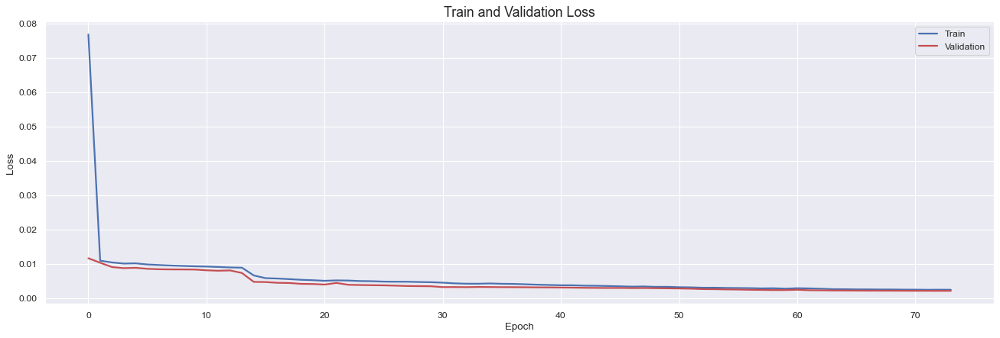

In [111]:
# Plot Train & Validation' Losses
plot_lstm_ae_train_val_loss(history_LSTM_AE_model)

#### Get X_train & X_test's Predictions & Scores

In [112]:
# Get Train & Test's Model Predictions | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
X_train_pred_3d = get_lstm_ae_predictions_3d(model=LSTM_AE_model,
                                                X_3d=X_train_3d,
                                                anomaly_detect=False)

X_test_pred_3d = get_lstm_ae_predictions_3d(model=LSTM_AE_model,
                                                X_3d=X_test_3d,
                                                anomaly_detect=False)

108/108 [==============================] - 1s 14ms/step


In [113]:
# Get Train & Test's Model Scores | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
X_train_scores_3d = get_lstm_ae_scores_3d(X_3d=X_train_3d,
                                            X_pred_3d=X_train_pred_3d,
                                            dist=DIST)

X_test_scores_3d = get_lstm_ae_scores_3d(X_3d=X_test_3d,
                                            X_pred_3d=X_test_pred_3d,
                                            dist=DIST)
print("Training data shape:", X_train_scores_3d.shape)
print("Test data shape:", X_test_scores_3d.shape)

Training data shape: (31093, 12, 16)
Test data shape: (3445, 12, 16)


In [114]:
# Get Train & Test's Model Scores back to 2D - Average of WIN_SIZE samples in time | WINDOWS approach!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!
X_train_scores = get_lstm_ae_scores_2d(X_3d=X_train_scores_3d,
                                        x_2d=train,
                                        win_size=WIN_SIZE,
                                        win_dir=WIN_DIR,
                                        dist=DIST)

X_test_scores = get_lstm_ae_scores_2d(X_3d=X_test_scores_3d,
                                        x_2d=test,
                                        win_size=WIN_SIZE,
                                        win_dir=WIN_DIR,
                                        dist=DIST)
print("Training data shape:", X_train_scores.shape)
print("Test data shape:", X_test_scores.shape)

Training data shape: (31093, 17)
Test data shape: (3445, 17)


### Avg. Thresholds

##### Get Train's Avg. Thresholds

In [115]:
# Get Train's Model Average Threshold - POM
avg_threshold_POM = get_lstm_ae_avg_threshold_per_of_max(X_scores=X_train_scores,
                                                         sensitivity=SENSITIVITY_PER_OF_MAX)

Avg. Threshold (99.0% of max(dist)):	0.03143969868785705


In [116]:
# Get Train's Model Average Threshold - POS
avg_threshold_POS = get_lstm_ae_avg_threshold_per_of_sum(X_scores=X_train_scores,
                                                          sensitivity=SENSITIVITY_PER_OF_SUM)

Avg. Threshold (99.0% of sum(dist)):	0.019923478997503817


##### Add Avg. Thresholds to X_train_scores & X_test_scores

In [117]:
# Add Model's Average Thresholds and Final Anomaly Score to Score's datasets
X_train_scores = add_lstm_ae_avg_thresholds(X_scores=X_train_scores,
                                            avg_threshold_per_of_max=avg_threshold_POM,
                                            avg_threshold_per_of_sum=avg_threshold_POS)
X_test_scores = add_lstm_ae_avg_thresholds(X_scores=X_test_scores,
                                           avg_threshold_per_of_max=avg_threshold_POM,
                                           avg_threshold_per_of_sum=avg_threshold_POS)

##### Anomalies Inspection

In [118]:
# Inspect timestamps where ANOMALY_COUNT_THRESHOLD has been broken - POM
X_test_scores[X_test_scores['Final_Anomaly_Score_POM']==1]

,uuid_835267,uuid_835268,uuid_835270,uuid_835271,uuid_835272,uuid_835274,uuid_835275,uuid_835278,uuid_835279,uuid_835281,uuid_835282,uuid_835283,uuid_835284,uuid_835285,uuid_835290,uuid_835291,Avg. Dist (sqr),Avg_Threshold_POM,Avg_Threshold_POS,Final_Anomaly_Score_POM,Final_Anomaly_Score_POS
Timestamp,,,,,,,,,,,,,,,,,,,,,


In [119]:
# Inspect timestamps where ANOMALY_COUNT_THRESHOLD has been broken - POS
X_test_scores[X_test_scores['Final_Anomaly_Score_POS']==1]

,uuid_835267,uuid_835268,uuid_835270,uuid_835271,uuid_835272,uuid_835274,uuid_835275,uuid_835278,uuid_835279,uuid_835281,uuid_835282,uuid_835283,uuid_835284,uuid_835285,uuid_835290,uuid_835291,Avg. Dist (sqr),Avg_Threshold_POM,Avg_Threshold_POS,Final_Anomaly_Score_POM,Final_Anomaly_Score_POS
Timestamp,,,,,,,,,,,,,,,,,,,,,
2023-06-14 00:15:00,0.000708,0.005285,0.053223,0.002037,0.010273,0.003760,0.002217,0.008674,0.218439,0.002401,0.003047,0.002511,0.001925,0.002030,0.002579,0.006123,0.020327,0.03144,0.019923,0,1
2023-06-14 00:20:00,0.000772,0.007703,0.049026,0.003206,0.006810,0.004827,0.002928,0.009004,0.222529,0.002732,0.003628,0.002952,0.002033,0.002265,0.003595,0.005585,0.020600,0.03144,0.019923,0,1
2023-06-14 00:25:00,0.000534,0.006866,0.049644,0.002854,0.005424,0.004517,0.003536,0.010115,0.231755,0.003295,0.003316,0.002028,0.002087,0.002654,0.004006,0.004237,0.021054,0.03144,0.019923,0,1
2023-06-14 00:30:00,0.000377,0.006354,0.049031,0.002690,0.006727,0.004160,0.003749,0.009807,0.234639,0.002986,0.003124,0.001768,0.002170,0.002408,0.004341,0.003640,0.021123,0.03144,0.019923,0,1
2023-06-14 00:35:00,0.000276,0.004791,0.050565,0.002061,0.006507,0.003895,0.003999,0.009526,0.237687,0.002988,0.003015,0.001601,0.002252,0.003280,0.004455,0.003126,0.021252,0.03144,0.019923,0,1
2023-06-14 00:40:00,0.000325,0.005140,0.049136,0.002174,0.006436,0.004857,0.005466,0.009459,0.239062,0.003758,0.003793,0.002094,0.001936,0.004678,0.005127,0.003089,0.021658,0.03144,0.019923,0,1
2023-06-14 00:45:00,0.000428,0.004076,0.048179,0.001212,0.006234,0.004818,0.005414,0.010951,0.232069,0.003178,0.003502,0.001652,0.002097,0.005741,0.004330,0.002357,0.021015,0.03144,0.019923,0,1
2023-06-14 00:50:00,0.000514,0.002978,0.047578,0.001158,0.006055,0.004679,0.004993,0.011929,0.223114,0.002557,0.003044,0.001281,0.002268,0.007296,0.003436,0.001833,0.020295,0.03144,0.019923,0,1
2023-06-14 09:45:00,0.000356,0.000694,0.109779,0.006099,0.002160,0.000289,0.000633,0.001597,0.189686,0.002732,0.001465,0.001515,0.002037,0.001486,0.002467,0.003208,0.020388,0.03144,0.019923,0,1


In [120]:
# Print timestamps vs Anomalous Series - POM
print_lstm_ae_anomalous_series_from_score(X_scores=X_test_scores,
                                          final_anomaly_score_col='Final_Anomaly_Score_POM')

In [121]:
# Print timestamps vs Anomalous Series - POS
print_lstm_ae_anomalous_series_from_score(X_scores=X_test_scores,
                                          final_anomaly_score_col='Final_Anomaly_Score_POS')

Anomalous Series @2023-06-14 00:15:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:20:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:25:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:30:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:35:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:40:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:45:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:50:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 09:45:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 09:50:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 09:55:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 10:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 10:05:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 10:10:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @20

### Individual Thresholds

##### Get Train's Individual Thresholds

In [122]:
# Get Train's Model Individuals Thresholds - POM
ind_thresholds_POM = get_lstm_ae_ind_thresholds_per_of_max(X_scores=X_train_scores,
                                                           sensitivity=SENSITIVITY_PER_OF_MAX)

Individual Series Threshold (uuid_835267 - 99.0% of max(dist)):	 0.034909147731864994
Individual Series Threshold (uuid_835268 - 99.0% of max(dist)):	 0.04549403971817123
Individual Series Threshold (uuid_835270 - 99.0% of max(dist)):	 0.038145130144910555
Individual Series Threshold (uuid_835271 - 99.0% of max(dist)):	 0.08379096672157481
Individual Series Threshold (uuid_835272 - 99.0% of max(dist)):	 0.13659941911719684
Individual Series Threshold (uuid_835274 - 99.0% of max(dist)):	 0.0329237736337613
Individual Series Threshold (uuid_835275 - 99.0% of max(dist)):	 0.09235160794881668
Individual Series Threshold (uuid_835278 - 99.0% of max(dist)):	 0.15860648232030067
Individual Series Threshold (uuid_835279 - 99.0% of max(dist)):	 0.15013772314906715
Individual Series Threshold (uuid_835281 - 99.0% of max(dist)):	 0.06643566276934314
Individual Series Threshold (uuid_835282 - 99.0% of max(dist)):	 0.06064860540992643
Individual Series Threshold (uuid_835283 - 99.0% of max(dist)):	

In [123]:
# Get Train's Model Individuals Thresholds - POS
ind_thresholds_POS = get_lstm_ae_ind_thresholds_per_of_sum(X_scores=X_train_scores,
                                                           sensitivity=SENSITIVITY_PER_OF_SUM)

Individual Series Threshold (uuid_835267 - 99.0% of sum(dist)):	 0.027358385318416275
Individual Series Threshold (uuid_835268 - 99.0% of sum(dist)):	 0.03644680963964651
Individual Series Threshold (uuid_835270 - 99.0% of sum(dist)):	 0.028627842520657348
Individual Series Threshold (uuid_835271 - 99.0% of sum(dist)):	 0.0685147391025575
Individual Series Threshold (uuid_835272 - 99.0% of sum(dist)):	 0.0475650131161911
Individual Series Threshold (uuid_835274 - 99.0% of sum(dist)):	 0.022369077557060798
Individual Series Threshold (uuid_835275 - 99.0% of sum(dist)):	 0.065695636156513
Individual Series Threshold (uuid_835278 - 99.0% of sum(dist)):	 0.08535691897553781
Individual Series Threshold (uuid_835279 - 99.0% of sum(dist)):	 0.11850677038185604
Individual Series Threshold (uuid_835281 - 99.0% of sum(dist)):	 0.05269526436344953
Individual Series Threshold (uuid_835282 - 99.0% of sum(dist)):	 0.04525491934674286
Individual Series Threshold (uuid_835283 - 99.0% of sum(dist)):	 0

##### Anomaly Matrix

In [124]:
# Get Test's Model Anomaly Matrix - POM
X_test_anomaly_matrix_POM = get_lstm_ae_anomaly_matrix_per_of_max(X_train_scores=X_train_scores,
                                                                  X_test_scores=X_test_scores,
                                                                  sensitivity=SENSITIVITY_PER_OF_MAX,
                                                                  anomaly_count_threshold=ANOMALY_COUNT_THRESHOLD)

In [125]:
# Get Test's Model Anomaly Matrix - POS
X_test_anomaly_matrix_POS = get_lstm_ae_anomaly_matrix_per_of_sum(X_train_scores=X_train_scores,
                                                                  X_test_scores=X_test_scores,
                                                                  sensitivity=SENSITIVITY_PER_OF_SUM,
                                                                  anomaly_count_threshold=ANOMALY_COUNT_THRESHOLD)

##### Anomalies Inspection

In [126]:
# Inspect timestamps where ANOMALY_COUNT_THRESHOLD has been broken - POM
anomaly_detected_POM = X_test_anomaly_matrix_POM[X_test_anomaly_matrix_POM['Final_Anomaly_Score_POM']==1]
anomaly_detected_POM

,uuid_835267_anomaly,uuid_835268_anomaly,uuid_835270_anomaly,uuid_835271_anomaly,uuid_835272_anomaly,uuid_835274_anomaly,uuid_835275_anomaly,uuid_835278_anomaly,uuid_835279_anomaly,uuid_835281_anomaly,uuid_835282_anomaly,uuid_835283_anomaly,uuid_835284_anomaly,uuid_835285_anomaly,uuid_835290_anomaly,uuid_835291_anomaly,Total_Anomaly_Count_POM,Final_Anomaly_Score_POM
Timestamp,,,,,,,,,,,,,,,,,,
2023-06-14 00:00:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:05:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:10:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:15:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:20:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-14 13:45:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 13:50:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 13:55:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1


In [127]:
# Inspect timestamps where ANOMALY_COUNT_THRESHOLD has been broken - POS
anomaly_detected_POS = X_test_anomaly_matrix_POS[X_test_anomaly_matrix_POS['Final_Anomaly_Score_POS']==1]
anomaly_detected_POS

,uuid_835267_anomaly,uuid_835268_anomaly,uuid_835270_anomaly,uuid_835271_anomaly,uuid_835272_anomaly,uuid_835274_anomaly,uuid_835275_anomaly,uuid_835278_anomaly,uuid_835279_anomaly,uuid_835281_anomaly,uuid_835282_anomaly,uuid_835283_anomaly,uuid_835284_anomaly,uuid_835285_anomaly,uuid_835290_anomaly,uuid_835291_anomaly,Total_Anomaly_Count_POS,Final_Anomaly_Score_POS
Timestamp,,,,,,,,,,,,,,,,,,
2023-06-13 23:55:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:00:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:05:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:10:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 00:15:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-14 14:05:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 14:10:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1
2023-06-14 14:15:00,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,2,1


In [128]:
# Print timestamps vs Anomalous Series - POM
print_lstm_ae_anomalous_series_from_matrix(anomaly_matrix=X_test_anomaly_matrix_POM)

Anomalous Series @2023-06-14 00:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:05:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:10:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:15:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:20:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:25:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:30:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:35:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:40:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:45:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:50:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:55:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 01:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 01:05:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @20

In [129]:
# Print timestamps vs Anomalous Series - POS
print_lstm_ae_anomalous_series_from_matrix(anomaly_matrix=X_test_anomaly_matrix_POS)

Anomalous Series @2023-06-13 23:55:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:05:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:10:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:15:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:20:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:25:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:30:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:35:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:40:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:45:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:50:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:55:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 01:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @20

### Combine Scores & Datasets

In [130]:
# Combine datasets for better visualization
combined_datasets = pd.concat([train.copy(), test.copy()])
combined_datasets_wo_ext_out = pd.concat([df_cleaned_z_score.copy(), test.copy()])
combined_datasets_smoothed = pd.concat([train_smoothed.copy(), test.copy()])
combined_scores = pd.concat([X_train_scores.copy(), X_test_scores.copy()])

# Reindex the Score's dataset to adjust the visualizations => to match the dates and make it easier to compare
X_test_scores_reidx = X_test_scores.reindex(index=test.index)
X_train_scores_reidx = X_train_scores.reindex(index=train.index)
combined_scores_reidx = pd.concat([X_train_scores_reidx.copy(), X_test_scores_reidx.copy()])

# Transform the X_train & X_test (datasets after normalization) to pandas make it easier to visualize
X_train_df = pd.DataFrame(X_train, columns=train.columns, index=train.index)
X_test_df = pd.DataFrame(X_test, columns=test.columns, index=test.index)
X_train_test_after_norm = pd.concat([X_train_df.copy(), X_test_df.copy()])

## VISUALIZATIONS (plots)

### Model's Avg. Distance (Histogram & Density)

##### Plot Train & Test Model's Avg. Distance Distribution (Histogram & Density)

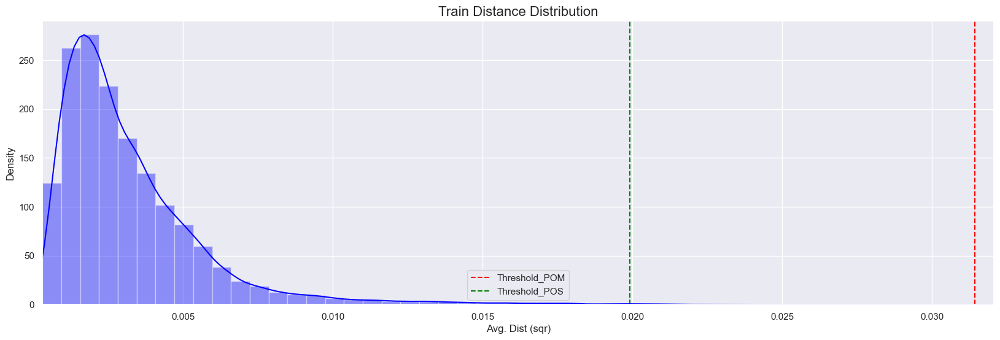

In [131]:
# Plot Train's Model Distance Distribution (with Avg. Thresholds)
plot_lstm_ae_model_dist_distribution(X_scores=X_train_scores,
                                    dataset='Train',
                                    threshold_POM=avg_threshold_POM,
                                    threshold_POS=avg_threshold_POS)

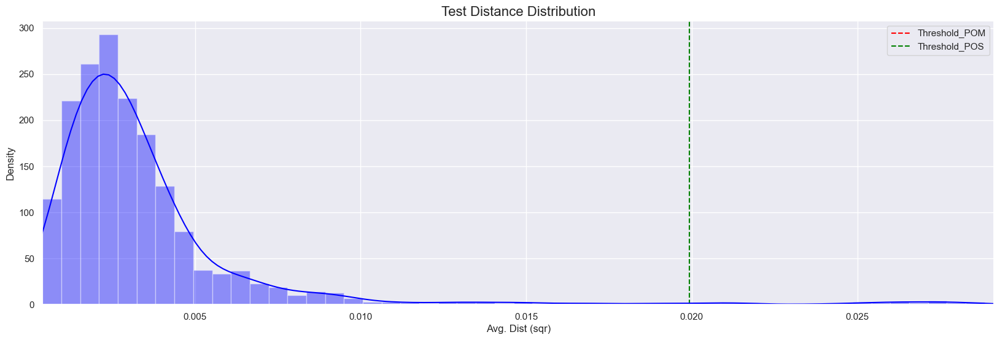

In [132]:
# Plot Test's Model Distance Distribution (with Avg. Thresholds)
plot_lstm_ae_model_dist_distribution(X_scores=X_test_scores,
                                    dataset='Test',
                                    threshold_POM=avg_threshold_POM,
                                    threshold_POS=avg_threshold_POS)

### Avg. Distances & Avg. Thresholds

In [133]:
# Define a specific series to visualize
serie='uuid_835279'

##### Plot Train & Test's Avg. Distance vs Avg. Thresholds

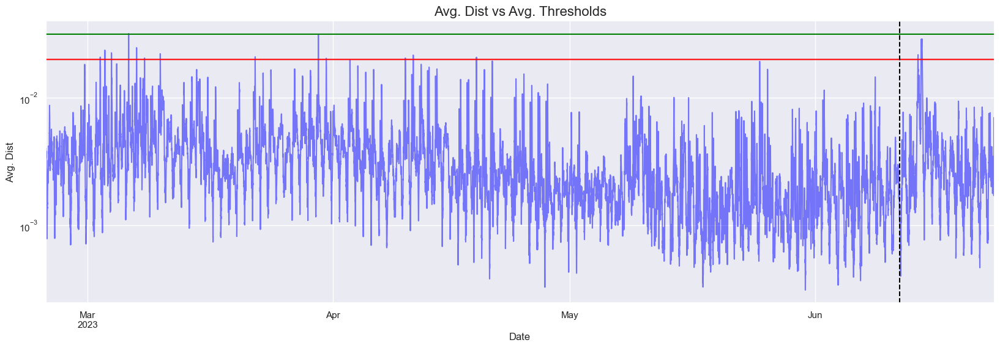

In [134]:
# Plot Train & Test's Model Avg. Distance vs Avg. Thresholds
plot_lstm_ae_dataset_avg_dist_vs_threshold(X_scores=combined_scores_reidx,
                                            train_split=TRAIN_SPLIT,
                                            train_split_idx=train_test_split_idx)

##### Plot Individual Series's Distance vs Avg. Threshold vs Original Values

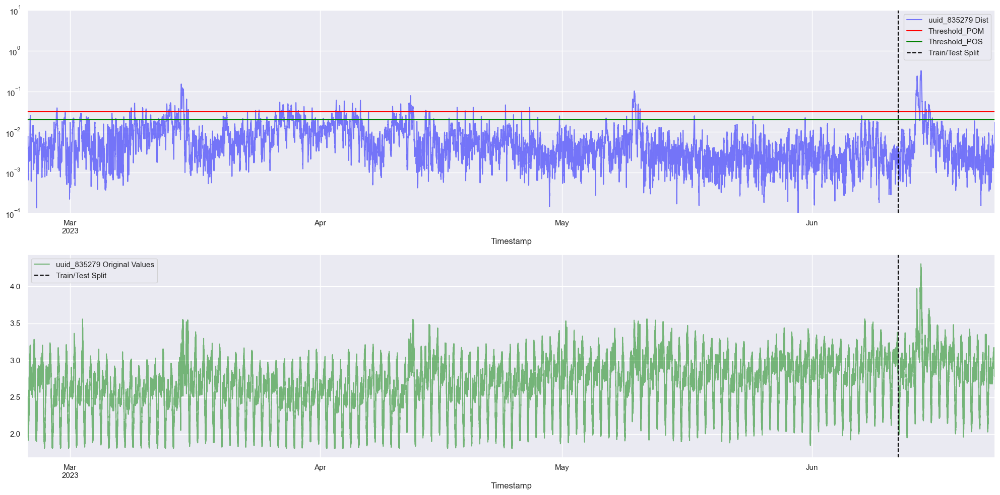

In [135]:
# Plot Individual Series's Distance vs Avg. Thresholds vs Original Values (v1) - FULL SERIE
plot_lstm_ae_ind_series_dist_threshold_orig_val(X_scores=combined_scores_reidx,
                                                dataset=combined_datasets_smoothed,
                                                serie=serie,
                                                threshold_POM=avg_threshold_POM,
                                                threshold_POS=avg_threshold_POS,
                                                train_split=TRAIN_SPLIT,
                                                train_split_idx=train_test_split_idx)

### Individual Distances & Thresholds

In [136]:
# Define a specific series to visualize
serie='uuid_835279'

##### Plot Individual Series's Loss vs Individual Threshold vs Original Values

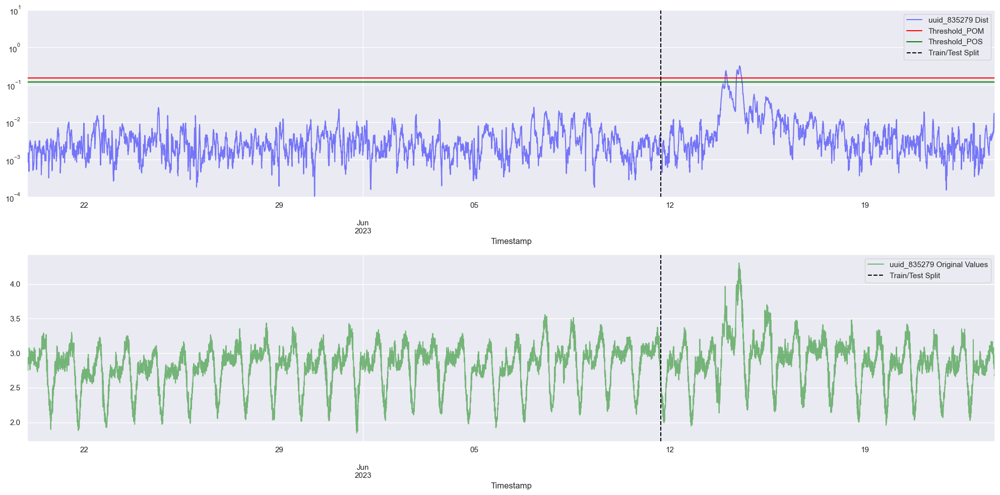

In [137]:
# Plot Individual Series's Distance vs Individual Thresholds vs Original Values (v1) - LAST 10000 SAMPLES
plot_lstm_ae_ind_series_dist_threshold_orig_val(X_scores=combined_scores_reidx[-10000:],
                                                dataset=combined_datasets_smoothed[-10000:],
                                                serie=serie,
                                                threshold_POM=ind_thresholds_POM.loc[serie][0],
                                                threshold_POS=ind_thresholds_POS.loc[serie][0],
                                                train_split=TRAIN_SPLIT,
                                                train_split_idx=train_test_split_idx)

In [138]:
# Plot Individual Series's Distance vs Individual Thresholds vs Original Values (v2) - FULL SERIE
plot_lstm_ae_ind_series_dist_threshold_orig_val_v2(X_scores=combined_scores_reidx,
                                                    dataset=combined_datasets_smoothed,
                                                    serie=serie,
                                                    threshold_POM=ind_thresholds_POM.loc[serie][0],
                                                    threshold_POS=ind_thresholds_POS.loc[serie][0],
                                                    train_split=TRAIN_SPLIT,
                                                    train_split_idx=train_test_split_idx)

##### Plot Individual Series throughout all stages (Original, Without Extreme Outliers & Smoothed)

In [139]:
# Plot Individual Series throughout all stages
plot_lstm_ae_all_dataset_stages(X_orig=combined_datasets,
                                X_wo_ext_out=combined_datasets_wo_ext_out,
                                X_smoothed=combined_datasets_smoothed,
                                serie=serie,
                                train_split=TRAIN_SPLIT,
                                train_split_idx=train_test_split_idx,
                                limit_y_to_smoothed='no')

### Plot Anomalous Series

#### Inspect Anomalous Series

In [140]:
# Print timestamps vs Anomalous Series - POM
print_lstm_ae_anomalous_series_from_matrix(anomaly_matrix=X_test_anomaly_matrix_POM)

Anomalous Series @2023-06-14 00:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:05:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:10:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:15:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:20:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:25:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:30:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:35:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:40:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:45:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:50:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:55:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 01:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 01:05:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @20

In [141]:
# Print timestamps vs Anomalous Series - POS
print_lstm_ae_anomalous_series_from_matrix(anomaly_matrix=X_test_anomaly_matrix_POS)

Anomalous Series @2023-06-13 23:55:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:05:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:10:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:15:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:20:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:25:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:30:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:35:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:40:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:45:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:50:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 00:55:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @2023-06-14 01:00:00:	['uuid_835270', 'uuid_835279']
Anomalous Series @20

#### Select Anomalous Series & Timestamp

In [142]:
# Select the series and timestamp to plot (up to six)
series_to_plot = ['uuid_835270', 'uuid_835279']
timestamp = '2023-06-14 09:45:00'

#### Plot Anomalous Series & Timestamp

In [143]:
# Plot up to six series intersted in
plot_lstm_ae_all_dataset_up_to_six_series(dataset=test,
                                            list_of_series=series_to_plot,
                                            timestamp=timestamp,
                                            samples_before=864,
                                            samples_after=864,
                                            train_split=None,
                                            train_split_idx=None)

In [144]:
# Plot selected series around selected timestamp
plot_lstm_ae_samples_around_timestamp(dataset=test,
                                        timestamp=timestamp,
                                        samples_before=864,
                                        samples_after=864,
                                        series=series_to_plot)

In [145]:
# Plot selected series around selected timestamp
plot_lstm_ae_samples_around_timestamp(dataset=test,
                                        timestamp=timestamp,
                                        samples_before=864,
                                        samples_after=864,
                                        series=None)

In [146]:
#test...

In [147]:
# Transform the X_train & X_test (datasets after normalization) to pandas make it easier to visualize
X_train_df = pd.DataFrame(X_train, columns=train.columns, index=train.index)
X_test_df = pd.DataFrame(X_test, columns=test.columns, index=test.index)
X_train_test_after_norm = pd.concat([X_train_df.copy(), X_test_df.copy()])

In [148]:
X_train_test_after_norm

,uuid_835267,uuid_835268,uuid_835270,uuid_835271,uuid_835272,uuid_835274,uuid_835275,uuid_835278,uuid_835279,uuid_835281,uuid_835282,uuid_835283,uuid_835284,uuid_835285,uuid_835290,uuid_835291
Timestamp,,,,,,,,,,,,,,,,
2023-02-23 16:20:00,0.199212,0.140942,0.185639,0.245644,0.543446,0.148082,0.096469,0.706955,0.347809,0.084925,0.123002,0.168936,0.250327,0.247219,0.442762,0.525902
2023-02-23 16:25:00,0.191776,0.130632,0.192666,0.233618,0.505541,0.140792,0.085548,0.732711,0.398221,0.079177,0.113372,0.162825,0.242040,0.235818,0.431851,0.517639
2023-02-23 16:30:00,0.188021,0.124581,0.173957,0.222473,0.288117,0.129141,0.072079,0.695176,0.309539,0.077038,0.100964,0.156288,0.233697,0.223467,0.427706,0.519748
2023-02-23 16:35:00,0.180691,0.117954,0.177499,0.232560,0.245962,0.126246,0.084638,0.683586,0.345369,0.073989,0.102009,0.147032,0.236898,0.236477,0.414321,0.511282
2023-02-23 16:40:00,0.174168,0.110968,0.161009,0.228488,0.260196,0.113773,0.065708,0.637903,0.289779,0.058999,0.089638,0.131652,0.213426,0.232790,0.373897,0.468068
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-06-23 15:55:00,0.326072,0.224534,0.321298,0.258443,0.494368,0.304045,0.170004,0.645365,0.568876,0.168291,0.243648,0.321805,0.408334,0.104774,0.406463,0.644999
2023-06-23 16:00:00,0.323281,0.216875,0.341720,0.260564,0.524528,0.286766,0.159629,0.675851,0.657651,0.143359,0.233996,0.305539,0.477489,0.101253,0.473004,0.630732
2023-06-23 16:05:00,0.310594,0.206945,0.289576,0.235210,0.463980,0.271344,0.154168,0.704807,0.493816,0.136373,0.218914,0.299448,0.407345,0.100200,0.396799,0.628520


In [149]:
serie= 'uuid_835279'
# Plot Individual Series throughout all stages
plot_lstm_ae_all_dataset_stages(X_orig=combined_datasets_wo_ext_out,
                                X_wo_ext_out=combined_datasets_smoothed,
                                X_smoothed=X_train_test_after_norm,
                                serie=serie,
                                train_split=TRAIN_SPLIT,
                                train_split_idx=train_test_split_idx,
                                limit_y_to_smoothed='no')

In [150]:
#['uuid_835267', 'uuid_835268', 'uuid_835270', 'uuid_835271', 'uuid_835272', 'uuid_835274', 'uuid_835275',
#                  'uuid_835278', 'uuid_835279', 'uuid_835281', 'uuid_835282', 'uuid_835283', 'uuid_835284', 'uuid_835285',
#                  'uuid_835290', 'uuid_835291']

timestamp = '2023-06-14 09:45:00'
series_to_plot = ['uuid_835267', 'uuid_835268', 'uuid_835270', 'uuid_835271', 'uuid_835272', 'uuid_835274']
series_to_plot = ['uuid_835275', 'uuid_835278', 'uuid_835279', 'uuid_835281', 'uuid_835282']
series_to_plot = ['uuid_835283', 'uuid_835284', 'uuid_835285', 'uuid_835290', 'uuid_835291']


In [151]:
# Plot up to six series intersted in
plot_lstm_ae_all_dataset_up_to_six_series(dataset=test,
                                            list_of_series=series_to_plot,
                                            timestamp=timestamp,
                                            samples_before=864,
                                            samples_after=864,
                                            train_split=None,
                                            train_split_idx=None)